<a href="https://colab.research.google.com/github/Troys-Code/AI_Prompt_Engineer_Template/blob/main/Prompt_Engineer_Application_Template_Created_By_Troy_Schultz.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install git+https://github.com/huggingface/diffusers transformers accelerate -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.9/270.9 kB 3.6 MB/s eta 0:00:00


In [ ]:
pip install compel

In [ ]:
from diffusers import StableDiffusionXLPipeline
from diffusers.utils import make_image_grid
import torch
from compel import Compel, ReturnedEmbeddingsType

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
torch.cuda.empty_cache()
pipeline = StableDiffusionXLPipeline.from_pretrained("segmind/SSD-1B", torch_dtype=torch.float16, use_safetensors=True, variant="fp16").to("cuda")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/577 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/474 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.77k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/602 [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/2.66G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
compel = Compel(
  tokenizer=[pipeline.tokenizer, pipeline.tokenizer_2] ,
  text_encoder=[pipeline.text_encoder, pipeline.text_encoder_2],
  returned_embeddings_type=ReturnedEmbeddingsType.PENULTIMATE_HIDDEN_STATES_NON_NORMALIZED,
  requires_pooled=[False, True]
)

  0%|          | 0/80 [00:00<?, ?it/s]

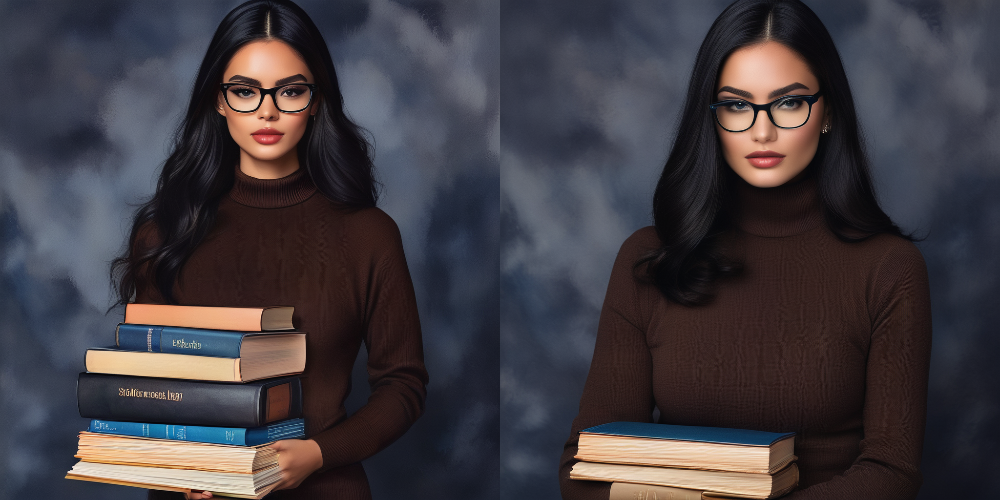

In [ ]:
prompt = ["yearbook model with tan skin and glasses in (dark brown turtleneck)1.3 (carrying a stack of textbooks in her arms)1.3, long face, glam makeup, full lips, long black hair, navy watercolor backdrop, realistic",
          "yearbook model with tan skin and glasses in (dark brown turtleneck)1.3 (cradling a stack of books)1.2, long face, glam makeup, full lips, long black hair, navy watercolor backdrop, realistic, 35mm, dlsr"]
neg_prompt = "disfigured, bad art, deformed, sloppy, messy, disorganized, disorderly, bad anatomy, bad proportions, cloned face, duplicate, extra arms, extra fingers, extra limbs, extra legs, fused fingers, gross proportions, long neck, malformed limbs, missing arms, missing legs, mutated hands, mutation, mutilated, morbid, out of frame, poorly drawn hands, poorly drawn face, too many fingers"

conditioning, pooled = compel(prompt)
generator = [torch.Generator().manual_seed(42) for _ in range(len(prompt))]
images = pipeline(prompt_embeds=conditioning, pooled_prompt_embeds=pooled, negative_prompt=neg_prompt, generator=generator, num_inference_steps=80).images
make_image_grid(images, rows=1, cols=2)

  0%|          | 0/50 [00:00<?, ?it/s]

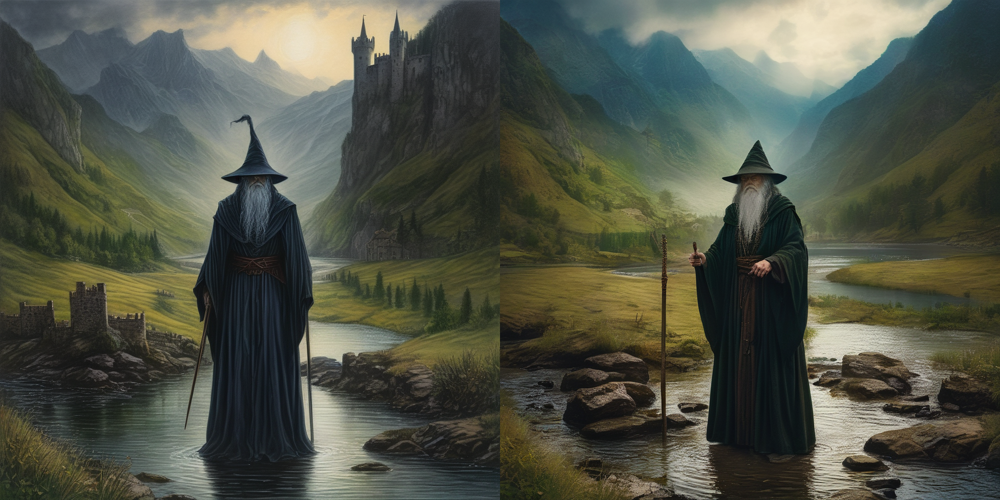

In [ ]:
prompt = ["dark fantasy, colored pencil, old wizard, (one staff)1.2, wearing a (dark grey)1.5 robe and hat, intense eyes, standing in front of (green)0.9 mountains and a stream of water, a castle far away, morning light, front view, (shadowy figure)1.5",
          "dark fantasy, muted color pencil art style, gloomy, old wizard, (one wooden staff)1.6, wearing a dark robe and hat, intense eyes, (green)0.8 mountains and a stream of water background, castle far away, morning light, front view, dark theme, shadowy style"]
neg_prompt = "abstract, cartoon, goofy, smooth, greyscale, bright, distorted"

conditioning, pooled = compel(prompt)
generator = [torch.Generator().manual_seed(69) for _ in range(len(prompt))]
images = pipeline(prompt_embeds=conditioning, pooled_prompt_embeds=pooled, negative_prompt=neg_prompt, generator=generator, num_inference_steps=50).images
make_image_grid(images, rows=1, cols=2)

  0%|          | 0/200 [00:00<?, ?it/s]

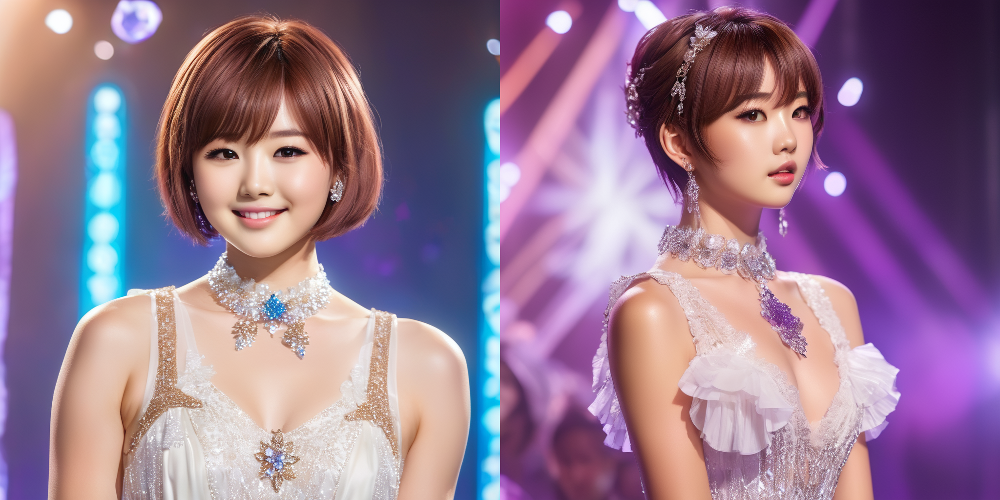

In [ ]:
prompt = ["female kpop idol, (medium short brown hair)1.5, on stage, face forward, round eyes, slight smile, white dress, crystal accessories, blue purple stage background strobe light, portrait style",
          "female kpop idol on stage, side view, head turn towards the camera, short brown hair, frilly white dress, crystal accessories, purple stage backdrop strobe light, side pose, celebrity, real, portrait style"]
neg_prompt = "distorted, long sleeve, legs, hands, fingers"

conditioning, pooled = compel(prompt)
generator = [torch.Generator().manual_seed(11) for _ in range(len(prompt))]
images = pipeline(prompt_embeds=conditioning, pooled_prompt_embeds=pooled, negative_prompt=neg_prompt, generator=generator, num_inference_steps=200).images
make_image_grid(images, rows=1, cols=2)

  0%|          | 0/65 [00:00<?, ?it/s]

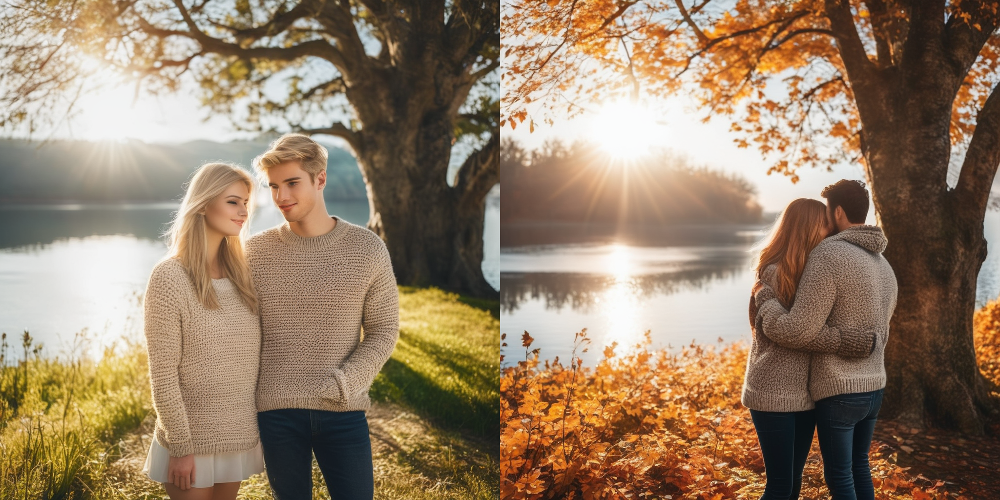

In [ ]:
prompt = ["blond haired, heterosexual, couple, young, two in love, under a tree, bright sun, in front of a lake, knit sweaters, portrait style",
          "(loving couple ((((hugging from behind))))), standing under a tree in the fall, the bright sun rising over the lake directly behind them, natural makeup, cozy sweaters, photograph style"]

neg_prompt = "extra appendages, three people, extra arms, malformed body, (extra fingers)1.6, disfigurement, malformed features, incorrect anatomy, inaccurate proportions, duplication of facial features, extra appendages, fused digits, nonproportional, irregular length, intact limbs, mutations, mutilation, morbid, out of frame, poorly drawn hands, ugly face, (missing fingers)1.2, (extra finger)1.9"

# neg_prompt = "(extra appendages)1.3, (extra fingers)1.6"

conditioning, pooled = compel(prompt)
generator = [torch.Generator().manual_seed(100) for _ in range(len(prompt))]
images = pipeline(prompt_embeds=conditioning, pooled_prompt_embeds=pooled, negative_prompt=neg_prompt, generator=generator, num_inference_steps=65).images
make_image_grid(images, rows=1, cols=2)

### Process Summary:

In my application for the AI Art Prompt Engineering position at Realm, I embarked on a journey that combined my technical abilities with creative problem-solving, especially in the realm of AI image generation using a distilled Stable Diffusion model for a challenge. My experience was marked by an evolution from a basic stable diffusion implementation to a more refined, controlled process, which is crucial for the high-quality visual storytelling expected at Realm.

Initially, the challenge was to generate images solely based on prompts using a limited capacity model. However, this approach often resulted in images with distorted features, particularly hands, arms and faces. This lack of finesse and clarity was a significant hurdle.

To address these issues, a trip to the Hugging Face documentation on Stable Diffusion was required. A breakthrough in quality came from modifying my original code to include advanced techniques such as weighted prompts and manual seeding. Weighted prompts allowed for more detailed control over specific image elements, significantly improving the accuracy and quality of the generated images. Manual seeding ensured consistency and replicability in the results.

I would like to highlight that my approach was the use of the smallest model from Stable Diffusion. Despite its limitations, like a lower token count (77 tokens) and reduced complexity, I was able to harness its potential effectively within these constraints. This showcases my ability to be resourceful and innovative, producing impressive outcomes even with limited resources.

I optimized my workflow while utilizing Google Colab, a free platform, effectively managing GPU usage and memory constraints. This involved strategic cache clearing to maximize efficiency, a crucial step in managing resources efficiently in a constrained hardware environment.

The process of recreating images from provided examples involved a meticulous approach:

1. Analysis of Provided Images:
I started by closely analyzing each image to understand the key elements like style, color palette, and composition.

2. Crafting Detailed Prompts:
I crafted detailed prompts, being descriptive yet concise to capture the essence of each image within the token limit.

3. Introducing Weighted Components: These were crucial in emphasizing specific areas like hands or facial expressions.

4. Adjusting Step Count Parameters:
This fine-tuning allowed for more refined image development, ensuring detail and clarity.

5. Implementing Manual Seeding:
For consistent quality across all generated images.

6. Optimizing Resource Usage:
Using Google Colab, I managed the resource constraints effectively, clearing GPU cache strategically.

7. Image Generation and Evaluation:
I generated images with the configured prompts and settings, evaluating each output against the provided examples for style resemblance and quality.

8. Iterative Refinement:
Based on initial outputs, I continuously refined the prompts and settings, nudging the output in the right direction each iteration.

This process demonstrates my technical proficiency and ability to adapt within constraints, ensuring high-quality outputs even with limited resources. My approach, scrappy yet effective, aligns perfectly with Realm's ethos of innovation and creativity, making me a valuable asset to the team.

### Reflection:
Here is my reflection page I wrote about after:

In my application for the AI Art Prompt Engineering position at Realm, I embarked on a journey that uniquely combined my technical abilities with creative problem-solving, especially in the realm of AI image generation using a distilled Stable Diffusion model for a challenge. My experience was an evolution from a basic stable diffusion implementation to a more refined, controlled process, which is crucial for the high-quality visual storytelling expected at Realm.

1. Problem-Solving Skills:
Initially, the challenge was generating images solely based on prompts using a limited capacity model. This often resulted in images with distorted features, such as hands, arms, and faces. Recognizing this as a significant hurdle, I dedicated myself to overcoming these limitations. By delving into the Hugging Face documentation on Stable Diffusion and experimenting with various techniques, I transformed these challenges into opportunities for learning and growth.

2. Innovation with Limited Resources:
I chose to utilize the smallest model from Stable Diffusion, which, despite its limitations like a lower token count (77 tokens) and reduced complexity, became my canvas for innovation. This constraint inspired me to explore advanced techniques like weighted prompts and manual seeding. The result was not only an improvement in the accuracy and quality of the generated images but also a testament to my ability to innovate within tight constraints.

5. Alignment with Realm’s Goals:
My approach aligns seamlessly with Realm’s ethos of blending the magic of AI with the art of visual storytelling. By focusing on detailed prompts, weighted components, and step count parameters, I have honed a skill set that is directly applicable to Realm's innovative AI social app. My experience in generating compelling visual stories using AI aligns with Realm's mission to empower users to create and share through words.

6. Future Contributions:
At Realm, I see myself not only applying these refined techniques but also expanding them to new horizons. I am excited about the opportunity to contribute to Realm's dynamic environment, bringing with me a proven track record of innovative problem-solving and an eagerness to explore new possibilities in AI art technology. My adaptive approach and commitment to quality are assets that I am eager to bring to your team.

In conclusion, my technical proficiency, coupled with my ability to adapt and innovate within constraints, positions me as an ideal candidate for Realm. I am excited about the prospect of joining your team and contributing to the innovative visual storytelling that defines Realm.